# Hands-On Audio Processing

IF4021 - Multimedia Information Processing 

Nama: Bagas Andreanto 

NIM: 122140017 

Link Github Repository: https://github.com/bagas017/Hands-on_Pemrosesan_Audio 

---

**Deskripsi Tugas** Tugas ini dirancang untuk menguji pemahaman mahasiswa terhadap konsep-konsep fundamental dalam pemrosesan audio digital termasuk manipulasi sinyal audio, filtering, pitch shifting, normalisasi, dan teknik remix audio. Mahasiswa diharapkan dapat menerapkan teori yang telah dipelajari dalam praktik langsung menggunakan Python dan pustaka pemrosesan audio.


#### Library yang digunakan:

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
import scipy
from scipy.signal import butter, filtfilt
from IPython.display import Audio, HTML, display
import os

print("Library yang digunakan:")
print(f"NumPy       : {np.__version__}")
print(f"Matplotlib  : {plt.matplotlib.__version__}")
print(f"Librosa     : {librosa.__version__}")
print(f"SciPy       : {scipy.__version__}")
print(f"SoundFile   : {sf.__version__}")

Library yang digunakan:
NumPy       : 2.2.6
Matplotlib  : 3.10.7
Librosa     : 0.11.0
SciPy       : 1.15.3
SoundFile   : 0.13.1


---

### Soal 1: Rekaman dan Analisis Suara Multi-Level



In [20]:
Path_Soal_Audio1 = os.path.join(os.getcwd(), 'data', 'Soal1_Audio.wav')

if os.path.exists(Path_Soal_Audio1):
 y, sr = librosa.load(Path_Soal_Audio1, sr=None)
 source_info = f"Lokasi File: {Path_Soal_Audio1}"


print(source_info)
print(f"Shape: {y.shape}")
print(f"Sample rate: {sr:,} Hz")
print(f"Durasi: {len(y)/sr:.2f} detik")


Lokasi File: c:\Users\Pongo\OneDrive\Desktop\Git-Upload\Tugas_Multimedia\Hands-on_Pemrosesan_Audio\data\Soal1_Audio.wav
Shape: (1203200,)
Sample rate: 48,000 Hz
Durasi: 25.07 detik


##### Visualisasi Waveform dan Spectrogram

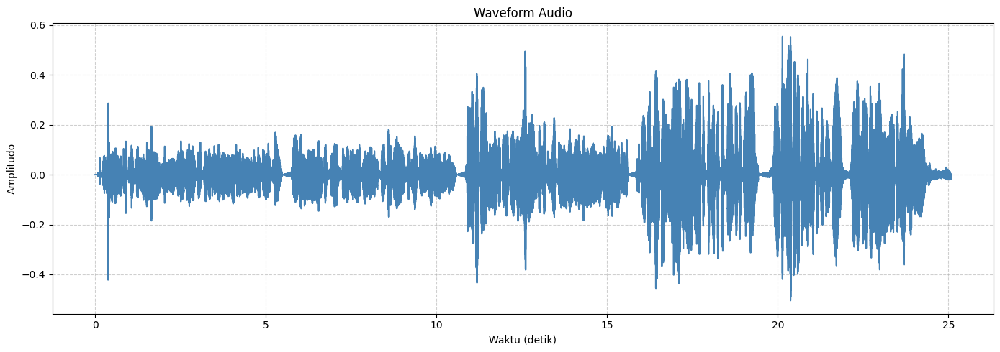

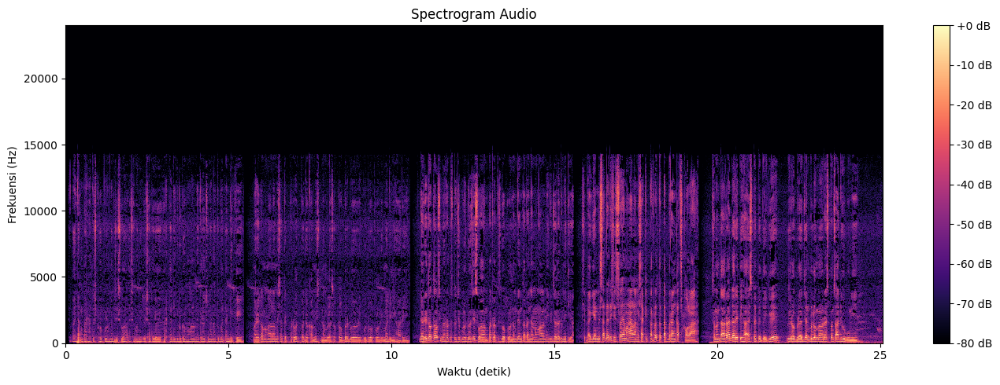

Audio Player:


In [21]:
# Plot waveform
duration = len(y) / sr
time = np.linspace(0, duration, len(y))

plt.figure(figsize=(14, 5))
plt.plot(time, y, color='steelblue')
plt.title('Waveform Audio')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Plot spectrogram
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram Audio')
plt.xlabel('Waktu (detik)')
plt.ylabel('Frekuensi (Hz)')
plt.tight_layout()
plt.show()

# Audio player
print("Audio Player:")
display(Audio(y, rate=sr))



#### **Penjelasan:**

Dapat dilihat pada waveform, untuk di detik awal 0-5 detik memiliki level suara yang sedikit rendah hal ini karena rekaman dilakukan dengan cara berbisik. Kemudian pada detik ke 5-10 suara mulai meningkat karena rekaman dilakukan dengan cara berbicara normal. Selanjutnya pada detik ke 10-15 suara mulai meningkat lagi karena rekaman dilakukan dengan cara berbicara dengan volume yang lebih keras. Pada detik ke 15-20 gelombang sedikit lebih rapat (frekuensi naik) karena audio direkam dengan suara cempreng. Dan pada detik ke 20-25 amplitudo naik karena suara direkam dengan cara berteriak.

 

**Kenapa bentuk visualisasi dari suara berbisik dan normal terlihat mirip?**

Mungkin karena saya terlalu dekat dalam merekam suara berbisik, disebabkan situasi di kos tidak kondusif untuk merekam suara berbisik. Sehingga visualisasi yang dihasilkan terlihat mirip meskipun jika di dengar secara langsung suara berbisik akan terdengar sedikit lebih pelan dibandingkan suara normal.



#### Resampling Audio

Sample rate asli: 48000
Sample rate baru: 16000


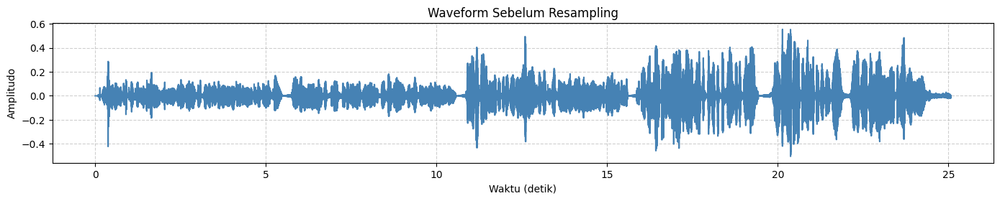

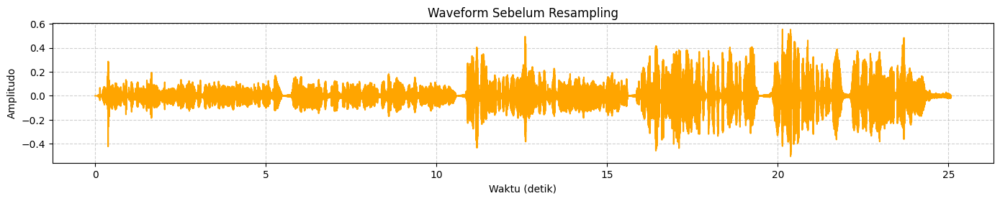

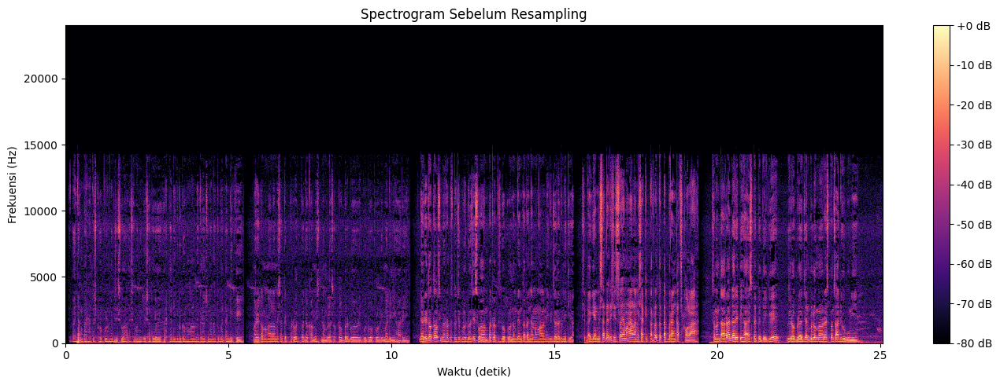

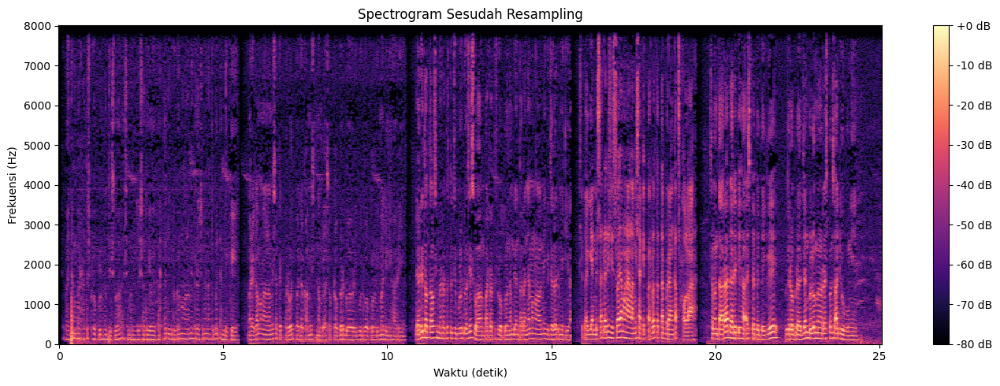

Audio Player Sebelum Resampling:


Audio Player Sesudah Resampling:


In [30]:
# Resampling Audio
print("Sample rate asli:", sr)

# Target resampling 16000 Hz
target_sr = 16000
y_resampled = librosa.resample(y=y, orig_sr=sr, target_sr=target_sr)
print("Sample rate baru:", target_sr)

# Menyimpan output resampling
output_dir = os.path.join(os.getcwd(), 'output')
os.makedirs(output_dir, exist_ok=True)
output_filename = 'Soal1_Audio_Resampled.wav'
output_path = os.path.join(output_dir, output_filename)


sf.write(output_path, y_resampled, target_sr)

# Perbandingan waveform sebelum dan sesudah resampling

# Waveform sebelum before
plt.figure(figsize=(14, 5))
plt.subplot(2, 1, 1)
plt.plot(time, y, color='steelblue')
plt.title('Waveform Sebelum Resampling')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Waveform sesudah after
Path_Output_Resampled = os.path.join(os.getcwd(), 'output', 'Soal1_Audio_Resampled.wav')

if os.path.exists(Path_Output_Resampled):
    y_resampled, sr_resampled = librosa.load(Path_Output_Resampled, sr=None)
    duration_resampled = len(y_resampled) / sr_resampled
    time_resampled = np.linspace(0, duration_resampled, len(y_resampled))

plt.figure(figsize=(14, 5))
plt.subplot(2, 1, 1)
plt.plot(time, y, color='orange')
plt.title('Waveform Sebelum Resampling')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.grid(True, which='both', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


# Spectrogram sebelum before
D_before = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(D_before, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram Sebelum Resampling')
plt.xlabel('Waktu (detik)')
plt.ylabel('Frekuensi (Hz)')
plt.tight_layout()
plt.show()

# Spectrogram sesudah after
D_after = librosa.amplitude_to_db(np.abs(librosa.stft(y_resampled)), ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(D_after, sr=sr_resampled, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram Sesudah Resampling')
plt.xlabel('Waktu (detik)')
plt.ylabel('Frekuensi (Hz)')
plt.tight_layout()
plt.show()

# Perbandingan Audio Player
print("Audio Player Sebelum Resampling:")
display(Audio(y, rate=sr))

print("Audio Player Sesudah Resampling:")
display(Audio(y_resampled, rate=sr_resampled))

#### **Penjelasan:**

Untuk dibagian waveform memang tidak terlihat perbedaan secara jelas, karena akan sulit untuk membedakan frekuensi dari waveform. 

Namun untuk spectrogram terlihat jelas untuk perbedaan dari hasil setelah di lakukan downsampling. Pada audio asli, frekuensi bisa terlihat hingga ke 15000 Hz, sedangkan setelah di downsampling menjadi 8000 Hz. 

Dari hasil perbandingan audio player juga menunjukan kualitas suara yang menurun untuk hasil setelah downsampling, dimana suara menjadi sedikit lebih pecah dan kurang jernih dibandingkan audio asli.

---

### Soal 2: Noise Reduction dengan Filtering



In [31]:
Path_Soal_Audio2 = os.path.join(os.getcwd(), 'data', 'Soal2_Audio.wav')

if os.path.exists(Path_Soal_Audio2):
    y2, sr2 = librosa.load(Path_Soal_Audio2, sr=None)
    source_info2 = f"Lokasi File: {Path_Soal_Audio2}"

print(source_info2)
print(f"Shape: {y2.shape}")
print(f"Sample rate: {sr2:,} Hz")
print(f"Durasi: {len(y2)/sr2:.2f} detik")

Lokasi File: c:\Users\Pongo\OneDrive\Desktop\Git-Upload\Tugas_Multimedia\Hands-on_Pemrosesan_Audio\data\Soal2_Audio.wav
Shape: (395264,)
Sample rate: 48,000 Hz
Durasi: 8.23 detik


**Low-Pass Filtering**


=== Low-pass filtering selesai! ===
Hasil disimpan di: c:\Users\Pongo\OneDrive\Desktop\Git-Upload\Tugas_Multimedia\Hands-on_Pemrosesan_Audio\output\Soal2_LowPass.wav


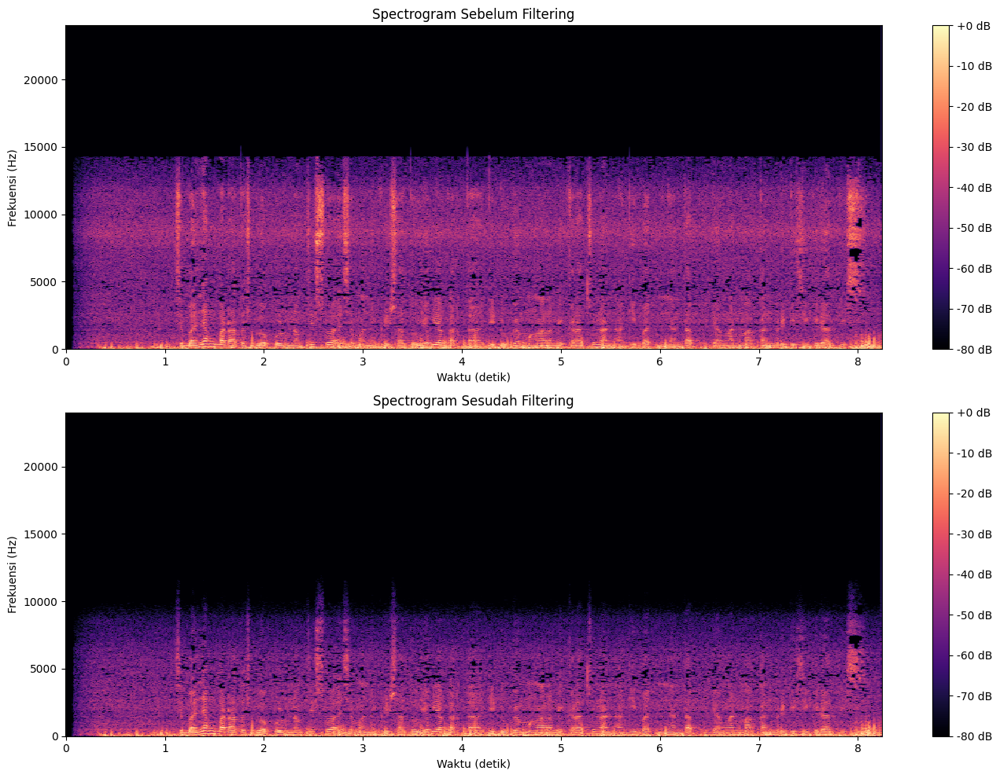

Audio Player Sebelum Filtering:


Audio Player Sesudah Low-pass Filtering:


In [43]:
# Fungsi low-pass filter
def butter_lowpass(cutoff, sr, order=4):
    nyq = 0.5 * sr  # frekuensi Nyquist
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

# Fungsi untuk menerapkan filter
def apply_lowpass(y, sr, cutoff=8000, order=4):
    b, a = butter_lowpass(cutoff, sr, order)
    y_filtered = filtfilt(b, a, y)
    return y_filtered

# Terapkan filter (6500 Hz)
y2_filtered = apply_lowpass(y2, sr2, cutoff=6500)

# Simpan hasil filtering
output_dir = os.path.join(os.getcwd(), 'output')
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, 'Soal2_LowPass.wav')

sf.write(output_path, y2_filtered, sr2)

print("\n=== Low-pass filtering selesai! ===")
print(f"Hasil disimpan di: {output_path}")


# Spectrogram sebelum dan sesudah filtering
D2_before = librosa.amplitude_to_db(np.abs(librosa.stft(y2)), ref=np.max)
D2_after = librosa.amplitude_to_db(np.abs(librosa.stft(y2_filtered)), ref=np.max)

plt.figure(figsize=(14, 10))

plt.subplot(2, 1, 1)
librosa.display.specshow(D2_before, sr=sr2, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram Sebelum Filtering')
plt.xlabel('Waktu (detik)')
plt.ylabel('Frekuensi (Hz)')

plt.subplot(2, 1, 2)
librosa.display.specshow(D2_after, sr=sr2, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram Sesudah Filtering')
plt.xlabel('Waktu (detik)')
plt.ylabel('Frekuensi (Hz)')

plt.tight_layout()
plt.show()

print("Audio Player Sebelum Filtering:")
display(Audio(y2, rate=sr2))

print("Audio Player Sesudah Low-pass Filtering:")
display(Audio(y2_filtered, rate=sr2))

**High-pass Filtering**


=== High-pass filtering selesai! ===
Hasil disimpan di: c:\Users\Pongo\OneDrive\Desktop\Git-Upload\Tugas_Multimedia\Hands-on_Pemrosesan_Audio\output\Soal2_HighPass.wav


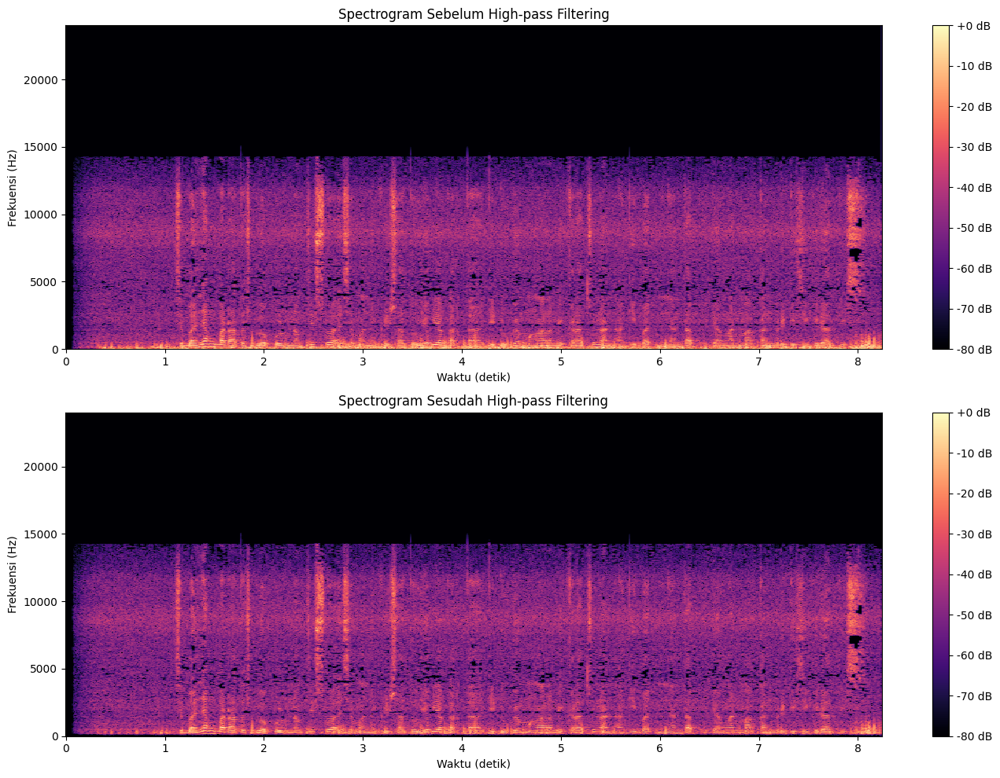

Audio Player Sebelum Filtering:


Audio Player Sesudah High-pass Filtering:


In [50]:
# Fungsi high-pass filter
def butter_highpass(cutoff, sr, order=4):
    nyq = 0.5 * sr  # frekuensi Nyquist
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

# Fungsi untuk menerapkan filter
def apply_highpass(y, sr, cutoff=100, order=4):
    b, a = butter_highpass(cutoff, sr, order)
    y_filtered = filtfilt(b, a, y)
    return y_filtered

# Terapkan filter
y2_filtered = apply_highpass(y2, sr2, cutoff=200)

# Simpan hasil ke folder output
output_dir = os.path.join(os.getcwd(), 'output')
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, 'Soal2_HighPass.wav')

sf.write(output_path, y2_filtered, sr2)

print("\n=== High-pass filtering selesai! ===")
print(f"Hasil disimpan di: {output_path}")


# Spectrogram sebelum dan sesudah filtering
D2_before = librosa.amplitude_to_db(np.abs(librosa.stft(y2)), ref=np.max)
D2_after = librosa.amplitude_to_db(np.abs(librosa.stft(y2_filtered)), ref=np.max)

plt.figure(figsize=(14, 10))

plt.subplot(2, 1, 1)
librosa.display.specshow(D2_before, sr=sr2, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram Sebelum High-pass Filtering')
plt.xlabel('Waktu (detik)')
plt.ylabel('Frekuensi (Hz)')

plt.subplot(2, 1, 2)
librosa.display.specshow(D2_after, sr=sr2, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram Sesudah High-pass Filtering')
plt.xlabel('Waktu (detik)')
plt.ylabel('Frekuensi (Hz)')

plt.tight_layout()
plt.show()

print("Audio Player Sebelum Filtering:")
display(Audio(y2, rate=sr2))

print("Audio Player Sesudah High-pass Filtering:")
display(Audio(y2_filtered, rate=sr2))

**Band-pass Filtering**


=== Band-pass filtering selesai! ===
Hasil disimpan di: c:\Users\Pongo\OneDrive\Desktop\Git-Upload\Tugas_Multimedia\Hands-on_Pemrosesan_Audio\output\Soal2_BandPass.wav


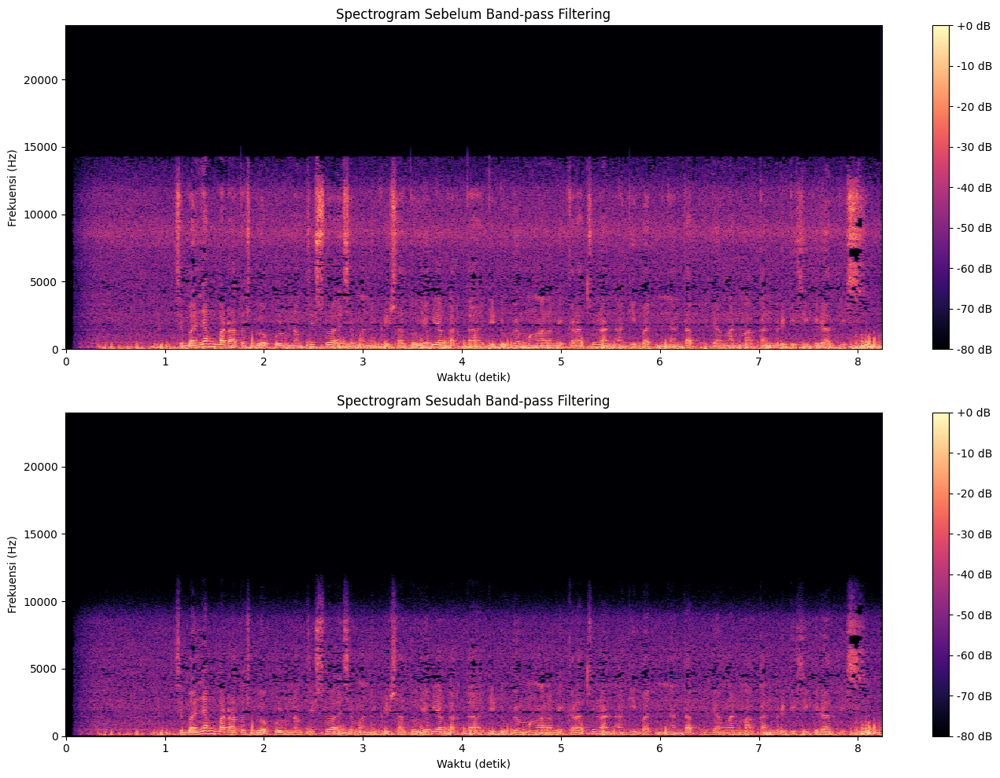

Audio Player Sebelum Filtering:


Audio Player Sesudah Band-pass Filtering:


In [65]:
# Fungsi band-pass filter
def butter_bandpass(lowcut, highcut, sr, order=4):
    nyq = 0.5 * sr  # frekuensi Nyquist
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band', analog=False)
    return b, a

# Fungsi untuk menerapkan filter
def apply_bandpass(y, sr, lowcut=100, highcut=8000, order=4):
    b, a = butter_bandpass(lowcut, highcut, sr, order)
    y_filtered = filtfilt(b, a, y)
    return y_filtered

# Terapkan filter
y2_filtered = apply_bandpass(y2, sr2, lowcut=100, highcut=7500)

# Simpan hasil ke folder output
output_dir = os.path.join(os.getcwd(), 'output')
os.makedirs(output_dir, exist_ok=True)
output_path = os.path.join(output_dir, 'Soal2_BandPass.wav')

sf.write(output_path, y2_filtered, sr2)

print("\n=== Band-pass filtering selesai! ===")
print(f"Hasil disimpan di: {output_path}")


# Spectrogram sebelum dan sesudah filtering
D2_before = librosa.amplitude_to_db(np.abs(librosa.stft(y2)), ref=np.max)
D2_after = librosa.amplitude_to_db(np.abs(librosa.stft(y2_filtered)), ref=np.max)

plt.figure(figsize=(14, 10))

plt.subplot(2, 1, 1)
librosa.display.specshow(D2_before, sr=sr2, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram Sebelum Band-pass Filtering')
plt.xlabel('Waktu (detik)')
plt.ylabel('Frekuensi (Hz)')

plt.subplot(2, 1, 2)
librosa.display.specshow(D2_after, sr=sr2, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram Sesudah Band-pass Filtering')
plt.xlabel('Waktu (detik)')
plt.ylabel('Frekuensi (Hz)')

plt.tight_layout()
plt.show()

print("Audio Player Sebelum Filtering:")
display(Audio(y2, rate=sr2))

print("Audio Player Sesudah Band-pass Filtering:")
display(Audio(y2_filtered, rate=sr2))

#### **Penjelasan:**

Audio sebelum dilakukan filtering (low-pass, high-pass, band-pass) memiliki banyak sebaran frekuensi tinggi dari rentang 0 sampai 15000 Hz. Sebaran tersebut memiliki intensitas beragam mulai dari 40dB sampai 60dB. Suara noise yang dihasilkan berupa suara dengan frekuensi tinggi (Hisssss) yaitu suara kipas laptop dan kipas angin yang menyebabkan seperti ada suara nafas di dalam audio.

Perbandingan setelah dilakukan filtering:

1. Low-